<a href="https://colab.research.google.com/github/adamyie/PORTFOLIO-python_studies_projects/blob/main/Spotify_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Spotify Trend Report
This report presents a comprehensive analysis of trends within the Spotify music ecosystem, focusing on the dynamic relationship between a song's audio characteristics and its performance metrics. By examining a large-scale dataset, we aim to uncover how musical attributes such as tempo, energy, danceability, and acousticness correlate with listener engagement over time. Specifically, this analysis will explore the evolution of these song characteristics and their influence on key indicators of success, including the number of followers, likes, and monthly listeners. The insights derived from this study will provide a valuable understanding of the factors that contribute to a song's popularity and longevity on the platform, offering strategic guidance for artists, producers, and marketers.

# Task
There are two relational datasets. Dataset artist.csv and tracks.csv are connected via a field called tracks['artist_id'] and artist['id']. However there is a catch:
tracks.csv artist_id field does not have the id readily available. They are stored as objects with "['" and "']" so to make the relationship possible, you need to remove those two brackets.

Here are all the data you need to run this report via Jupyter:
* "artists.csv"
* "tracks.csv"

## Data loading

### Subtask:
Load the two CSV files, artists.csv and tracks.csv, into pandas DataFrames.


**Reasoning**:
Load the two CSV files into pandas DataFrames and display the first 5 rows of each to verify.



In [ ]:
# @title
import pandas as pd
!pip install joypy==0.2.6
try:
    df_artists = pd.read_csv('artists.csv')
    df_tracks = pd.read_csv('tracks.csv')

    display(df_artists.head())
    display(df_tracks.head())
except FileNotFoundError:
    print("Error: One or both of the CSV files were not found.")
except pd.errors.ParserError:
    print("Error: Could not parse the CSV file. Check the file format.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0


,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [ ]:
# @title
print("Info for df_artists:")
df_artists.info()

print("\nInfo for df_tracks:")
df_tracks.info()

print("Description for df_artists:")
display(df_artists.describe())

print("\nDescription for df_tracks:")
display(df_tracks.describe())

print("Head of df_artists:")
display(df_artists.head())

print("\nHead of df_tracks:")
display(df_tracks.head())

Info for df_artists:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1162095 entries, 0 to 1162094
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   id          1162095 non-null  object 
 1   followers   1162084 non-null  float64
 2   genres      1162095 non-null  object 
 3   name        1162092 non-null  object 
 4   popularity  1162095 non-null  int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 44.3+ MB

Info for df_tracks:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-n

,followers,popularity
count,1.162084e+06,1.162095e+06
mean,1.022070e+04,8.795961e+00
std,2.543995e+05,1.355777e+01
min,0.000000e+00,0.000000e+00
25%,1.000000e+01,0.000000e+00
50%,5.700000e+01,2.000000e+00
75%,4.170000e+02,1.300000e+01
max,7.890023e+07,1.000000e+02



Description for df_tracks:


,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,586672.000000,5.866720e+05,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000
mean,27.570053,2.300512e+05,0.044086,0.563594,0.542036,5.221603,-10.206067,0.658797,0.104864,0.449863,0.113451,0.213935,0.552292,118.464857,3.873382
std,18.370642,1.265261e+05,0.205286,0.166103,0.251923,3.519423,5.089328,0.474114,0.179893,0.348837,0.266868,0.184326,0.257671,29.764108,0.473162
min,0.000000,3.344000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13.000000,1.750930e+05,0.000000,0.453000,0.343000,2.000000,-12.891000,0.000000,0.034000,0.096900,0.000000,0.098300,0.346000,95.600000,4.000000
50%,27.000000,2.148930e+05,0.000000,0.577000,0.549000,5.000000,-9.243000,1.000000,0.044300,0.422000,0.000024,0.139000,0.564000,117.384000,4.000000
75%,41.000000,2.638670e+05,0.000000,0.686000,0.748000,8.000000,-6.482000,1.000000,0.076300,0.785000,0.009550,0.278000,0.769000,136.321000,4.000000
max,100.000000,5.621218e+06,1.000000,0.991000,1.000000,11.000000,5.376000,1.000000,0.971000,0.996000,1.000000,1.000000,1.000000,246.381000,5.000000


Head of df_artists:


,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0



Head of df_tracks:


,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


## Data cleaning

### Subtask:
Clean the 'artist_id' column in the 'tracks' DataFrame.


**Reasoning**:
Clean the 'id_artists' column in df_tracks by removing the leading "['" and trailing "']", then convert it to numeric type. Handle potential errors during the conversion.



In [ ]:
# @title
import pandas as pd

# Remove leading "['" and trailing "']" from 'id_artists'
df_tracks['id_artists'] = df_tracks['id_artists'].str.replace("['", '', regex=False)
df_tracks['id_artists'] = df_tracks['id_artists'].str.replace("']", '', regex=False)
df_tracks['artists'] = df_tracks['artists'].str.replace("']", '', regex=False)
df_tracks['artists'] = df_tracks['artists'].str.replace("['", '', regex=False)

display(df_tracks['id_artists'])

,id_artists
0,45tIt06XoI0Iio4LBEVpls
1,14jtPCOoNZwquk5wd9DxrY
2,5LiOoJbxVSAMkBS2fUm3X2
3,5LiOoJbxVSAMkBS2fUm3X2
4,3BiJGZsyX9sJchTqcSA7Su
...,...
586667,1QLBXKM5GCpyQQSVMNZqrZ
586668,1dy5WNgIKQU6ezkpZs4y8z
586669,37M5pPGs6V1fchFJSgCguX
586670,"4jGPdu95icCKVF31CcFKbS', '5ebPSE9YI5aLeZ1Z2gkqjn"


## Data wrangling

### Subtask:
Merge the cleaned tracks data with the artists data. Provided after is the decription of the merged data to preview the amount of data removed after the merged of two datasets which originally had 600k to 1.16m rows.


**Reasoning**:
Merge the two dataframes based on the cleaned 'id_artists' column in df_tracks and 'id' column in df_artists. Then, display the first few rows of the merged dataframe and check its shape.



In [ ]:
# @title
# Merge the two dataframes
df_merged = pd.merge(df_tracks, df_artists, left_on='id_artists', right_on='id', how='inner')

df_merged.rename(columns={'popularity_y': 'popularity_artist', 'name_y': 'name_artist', 'name_x': 'name_track', 'popularity_x': 'popularity_track'}, inplace=True)
df_merged = df_merged.drop('id_y', axis=1)
df_merged.rename(columns={'name_y': 'name_artist'}, inplace=True)

print(df_merged.columns)

# Display the first few rows of the merged dataframe
display(df_merged.head())

# Check the shape of the merged dataframe
print(f"Shape of the merged DataFrame: {df_merged.shape}")

print("Description for df_merged:")
display(df_merged.describe())

Index(['id_x', 'name_track', 'popularity_track', 'duration_ms', 'explicit',
       'artists', 'id_artists', 'release_date', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'followers', 'genres', 'name_artist', 'popularity_artist'],
      dtype='object')


,id_x,name_track,popularity_track,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,genres,name_artist,popularity_artist
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,Uli,45tIt06XoI0Iio4LBEVpls,1922-02-22,0.645,0.4450,...,0.674,0.7440,0.151,0.127,104.851,3,91.0,[],Uli,4
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY,1922-06-01,0.695,0.2630,...,0.797,0.0000,0.148,0.655,102.009,1,3.0,[],Fernando Pessoa,0
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.434,0.1770,...,0.994,0.0218,0.212,0.457,130.418,5,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.321,0.0946,...,0.995,0.9180,0.104,0.397,169.980,3,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,1922,0.402,0.1580,...,0.989,0.1300,0.311,0.196,103.220,4,11327.0,"['adult standards', 'big band', 'easy listenin...",Dick Haymes,35


Shape of the merged DataFrame: (470038, 24)
Description for df_merged:


,popularity_track,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,popularity_artist
count,470038.000000,4.700380e+05,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,470038.000000,4.700380e+05,470038.000000
mean,28.392524,2.267375e+05,0.034987,0.565913,0.555447,5.223099,-9.883890,0.664434,0.100757,0.429147,0.093756,0.213999,0.564334,119.226204,3.879657,1.064992e+06,50.310469
std,17.494863,1.147592e+05,0.183746,0.159077,0.244112,3.520338,4.618667,0.472189,0.178089,0.339304,0.241880,0.185237,0.252629,29.704765,0.456678,3.851286e+06,19.688863
min,0.000000,3.344000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,15.000000,1.756470e+05,0.000000,0.460000,0.367000,2.000000,-12.489000,0.000000,0.033200,0.088800,0.000000,0.098000,0.361000,96.361000,4.000000,1.295900e+04,38.000000
50%,28.000000,2.147870e+05,0.000000,0.577000,0.560000,5.000000,-9.137000,1.000000,0.042800,0.394000,0.000019,0.139000,0.576000,118.041000,4.000000,9.399400e+04,52.000000
75%,41.000000,2.615162e+05,0.000000,0.682000,0.755000,8.000000,-6.471000,1.000000,0.071300,0.746000,0.005120,0.278000,0.778000,137.293500,4.000000,5.953350e+05,65.000000
max,99.000000,5.621218e+06,1.000000,0.991000,1.000000,11.000000,5.376000,1.000000,0.969000,0.996000,1.000000,1.000000,1.000000,246.381000,5.000000,7.890023e+07,100.000000


## **Data Transformation**

Create a new column for year, derived from the released_date column to provide annual context for each song releases. Then, create another column for duration to be in minutes by dividing duration_ms (milliseconds) by 60000. This is because most spotify songs are viewable with minutes unit of measurement.

In [ ]:
# @title
import pandas as pd

# Extract the first 4 digits from the 'release_date' column for the year
df_merged['year'] = df_merged['release_date'].str[:4].astype(int)

# Calculate duration in minutes (assuming duration_ms is already present)
df_merged['duration_mins'] = df_merged['duration_ms'] / 60000

df_merged.head()

,id_x,name_track,popularity_track,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,liveness,valence,tempo,time_signature,followers,genres,name_artist,popularity_artist,year,duration_mins
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,Uli,45tIt06XoI0Iio4LBEVpls,1922-02-22,0.645,0.4450,...,0.151,0.127,104.851,3,91.0,[],Uli,4,1922,2.115050
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,Fernando Pessoa,14jtPCOoNZwquk5wd9DxrY,1922-06-01,0.695,0.2630,...,0.148,0.655,102.009,1,3.0,[],Fernando Pessoa,0,1922,1.636667
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.434,0.1770,...,0.212,0.457,130.418,5,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23,1922,3.027333
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,Ignacio Corsini,5LiOoJbxVSAMkBS2fUm3X2,1922-03-21,0.321,0.0946,...,0.104,0.397,169.980,3,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23,1922,2.948450
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,Dick Haymes,3BiJGZsyX9sJchTqcSA7Su,1922,0.402,0.1580,...,0.311,0.196,103.220,4,11327.0,"['adult standards', 'big band', 'easy listenin...",Dick Haymes,35,1922,2.718000


## **Data Validation**
Ensure that there are no nulls and duplicates in necessary columns such as name, characteristics, popularity, id, year, and tempo.

In [ ]:
# @title
# Identify nulls and duplicates, delete if any
print("Nulls in df_merged:")
print(df_merged.isnull().sum())

print("\nDuplicates in df_merged:")
print(df_merged.duplicated().sum())

Nulls in df_merged:
id_x                 0
name_track           0
popularity_track     0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
followers            0
genres               0
name_artist          0
popularity_artist    0
year                 0
duration_mins        0
dtype: int64

Duplicates in df_merged:
0


## **Regression Analysis**

Proving whether the data is accurate for a hypothesis in this report is highly important, hence a regression analysis needs to be conducted to ensure data integrity and accuracy. The regression analysis will cover the following points:


1.   Y variable annotates Year as the main observation as we want to see relationship between characteristics, popularity, and other aspects of a track with annual movement.
2.   Regression will decide whether specific data points are great to forecast the next trend within a song for the years after.

3. Regression Analysis suggests that there is an R-Squared value of 0.456 which suggest that data is nearing 50% of variabilty which suggest that 50% of the data cannot be explained by the model, but 50% are significant to prove the hypothesis.
4. Moreover, P-values is almost all data are nearing 0%, suggesting that there are no high residuals or errors within the data set which could present bias and inaccuracy.

In [ ]:
# @title
import statsmodels.api as sm
import pandas as pd

# Define the independent variables (features) and the dependent variable (target)
# Include relevant song characteristics. Let's pick a few common ones as an example.
song_characteristics = ['danceability', 'energy', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'loudness']
X = df_merged[song_characteristics + ['popularity_track', 'explicit', 'duration_mins']]
y = df_merged['year']

# Add a constant to the independent variables matrix
X = sm.add_constant(X)

# Fit the multiple regression model
model = sm.OLS(y, X).fit()

# Print the regression summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   year   R-squared:                       0.484
Model:                            OLS   Adj. R-squared:                  0.484
Method:                 Least Squares   F-statistic:                 4.006e+04
Date:                Thu, 05 Jun 2025   Prob (F-statistic):               0.00
Time:                        06:30:24   Log-Likelihood:            -1.9488e+06
No. Observations:              470038   AIC:                         3.898e+06
Df Residuals:                  470026   BIC:                         3.898e+06
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             1976.6827      0.234  

## **Data Visualisation and Analysis 1: Correlation Diagram**

### The Visualisation is a heatmap, plotting different numerical variables representing how each data are related to each other
* **Graph Structure**: This is a heatmap displaying the correlation matrix of the numerical variables in your df_merged dataframe. The heatmap uses colour to represent the strength and direction of the linear relationship between pairs of variables.
* **The Grid**: The visualisation is presented as a grid. Both the rows and columns of the grid represent the numerical variables from your dataframe (like danceability, energy, popularity, etc.).
* **The Colours**: Each cell in the grid is coloured. The colour of a cell indicates the correlation coefficient between the variable in that row and the variable in that column.
  * A colormap ('coolwarm' in this instance) is used to map the correlation values to colours. Typically, in a 'coolwarm' colormap:
    * Colours towards one end (e.g., blue/cool colours) represent strong negative correlations (as one variable increases, the other tends to decrease).
    * Colours towards the centre (e.g., white/neutral colours) represent correlations close to zero (little to no linear relationship).
    * Colours towards the other end (e.g., red/warm colours) represent strong positive correlations (as one variable increases, the other also tends to increase).
* **The Numbers**: The correlation coefficient value is annotated directly on each cell. This number ranges from -1 to +1 explained in the following:
  * A value of +1 indicates a perfect positive linear correlation.
  * A value of -1 indicates a perfect negative linear correlation.
  * A value of 0 indicates no linear correlation.
  * Values closer to +1 or -1 indicate stronger linear relationships.
  * The values are formatted to two decimal places (fmt=".2f"), making them easy to read.
* **The Diagonal**: The diagonal cells, where a variable is correlated with itself, will always have a correlation coefficient of 1 and are typically coloured at the strongest positive end of the colormap.
* **Symmetry**: Correlation matrices are symmetric. The correlation between variable A and variable B is the same as the correlation between variable B and variable A, so the heatmap is mirrored across the diagonal.
* **Title**: The title, "Correlation Matrix of Numerical Variables", clearly states what the visualisation represents.

#### **Summary**
The first correlation matrix, which explores relationships between all numerical variables in the dataset, reveals a range of significant interdependencies that underpin Spotify song characteristics. Most notably, energy and loudness show a very strong positive correlation (0.75), indicating that louder tracks tend to be more energetic—an expected outcome considering high-energy genres often include more amplified instrumentation and production. Additionally, energy correlates negatively with acousticness (-0.70), suggesting that more energetic songs are typically less acoustic, aligning with the trend toward electronically produced music. There is also a mild positive correlation between popularity_y and followers (0.42), which intuitively reflects how artists with larger followings tend to produce more popular tracks. Intriguingly, popularity_x correlates negatively with acousticness (-0.34), reinforcing the notion that mainstream appeal skews toward less acoustic, more electronically enhanced music. Another interesting pattern is the weak correlation between explicit content and other variables, implying that explicit lyrics are distributed relatively evenly across song types and popularity levels, rather than being a defining feature of specific musical traits.

Turning to the second correlation matrix, which isolates the relationship between year and various song characteristics, we uncover clearer trends about how Spotify music has evolved over time. One of the most notable patterns is the negative correlation between acousticness and year (-0.48), indicating a steady decline in acoustic elements in modern music. This aligns with the rise of synthetic and digital production in mainstream genres over the last decade. Loudness (0.42) and energy (0.41) both show a positive correlation with year, suggesting that contemporary songs have become progressively louder and more energetic—a trend sometimes referred to as part of the "loudness war" in modern production. Furthermore, valence (emotional positivity) and danceability exhibit moderate positive correlations with each other (0.52) and are modestly aligned with recent years, hinting that modern songs are becoming more upbeat and tailored to dance-oriented listening. The tempo of songs, however, shows only a weak correlation with year (0.11), suggesting that while production elements have shifted, the average pacing of songs has remained relatively stable. Altogether, these correlations present a compelling narrative: Spotify music over time is becoming more electronically produced, louder, more energetic, and potentially more aligned with the preferences of a dance-friendly, digital-native audience.

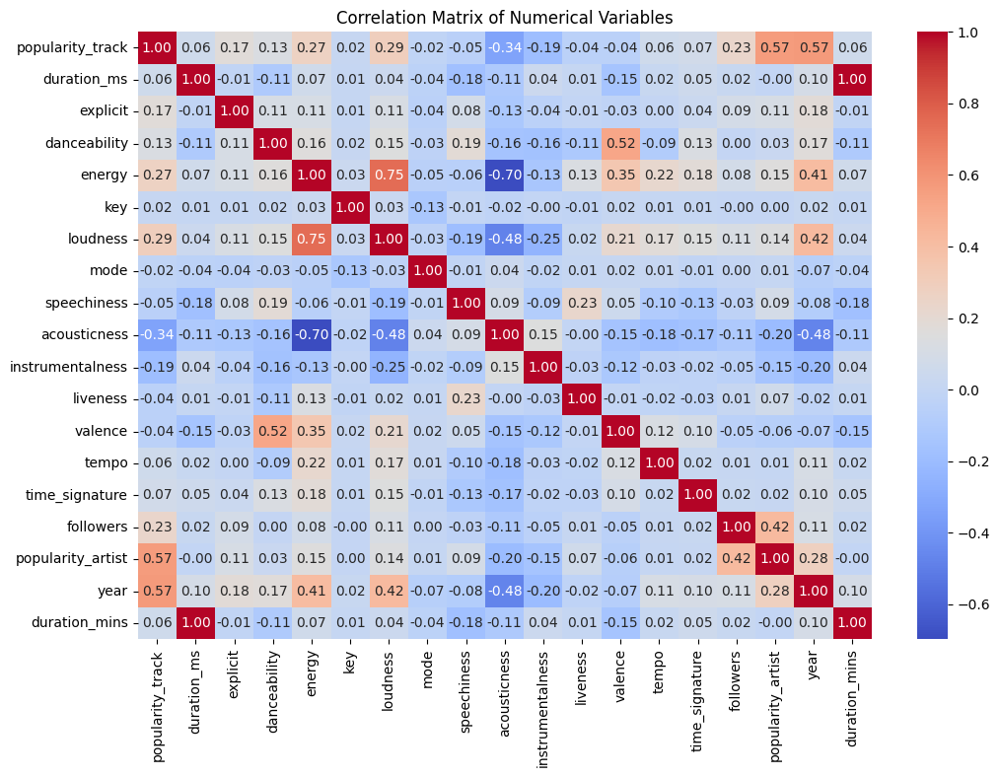

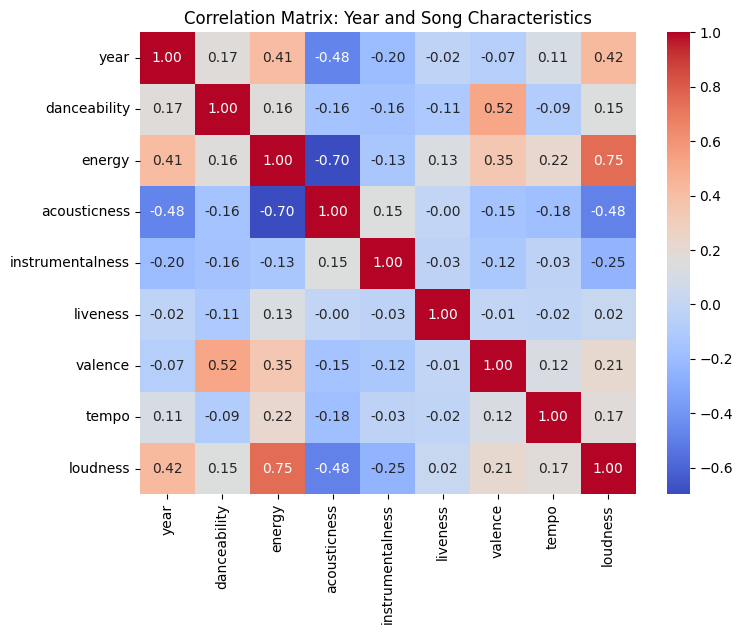

In [ ]:
# @title
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
correlation_matrix = df_merged.select_dtypes(include=['float64', 'int64']).corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

# List of core song characteristics
song_characteristics = ['danceability', 'energy', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'loudness']

# Create a new DataFrame with 'year' and the song characteristics
df_correlation_subset = df_merged[['year'] + song_characteristics]

# Calculate the correlation matrix for the subset
correlation_matrix_subset = df_correlation_subset.corr()

plt.figure(figsize=(8, 6)) # Adjust figure size as needed
sns.heatmap(correlation_matrix_subset, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: Year and Song Characteristics')
plt.show()

## **Data Visualisation and Analysis 2: 3D Cubic Plot**

### The Visualisation is a Series of 3D Scatter Plots, Showing the Changes of Song Characteristics Over Time Within 10-year Intervals:

In [ ]:
# @title **Choose Your Variable for Observation**:
variable1 = "energy" # @param ["danceability","energy","acousticness","instrumentalness","liveness","valence","tempo","loudness"]
variable2 = "loudness" # @param ["danceability","energy","acousticness","instrumentalness","liveness","valence","tempo","loudness"]
import plotly.express as px

# Filter for a specific 10-year range (as an example)
start_year = 1920
end_year = 2021
df_interval = df_merged[(df_merged['year'] >= start_year) & (df_merged['year'] <= end_year)].copy()

fig = px.scatter_3d(
    df_interval,
    x='year',
    y=variable1,
    z=variable2,
    color='popularity_track',
    color_continuous_scale='Viridis',
    size_max=10,
    title=f'3D Plot: Year vs {variable1} vs {variable2} ({start_year}-{end_year})',
    opacity=0.7
)

fig.update_layout(scene=dict(
    xaxis_title='Year',
    yaxis_title=variable1,
    zaxis_title=variable2
    ),
# HERE IS WHERE YOU ADJUST THE SIZE:
    width=900,  # Increase this value for a wider plot
    height=700  # Increase this value for a taller plot
)
fig.show()


## **Data Visualisation and Analysis 3: Histogram**

### The Visualisation Shows Histograms of Selected Song Characteristics Across Different Decades (1950s, 1980s, 2010s):

* **Chart Structure**: Each figure contains three separate histograms arranged horizontally in a single row. The horizontal axis of each histogram represents the value of a specific song characteristic (e.g., 'Danceability', 'Energy', 'Loudness'), and the vertical axis represents the 'Frequency' (the number of songs with values within a given range). Each histogram within a figure corresponds to a distinct decade (1950s, 1980s, or 2010s), indicated by the subplot title.
* **Song Representation**: The data points used in these histograms are derived from the df_merged DataFrame, filtered to include only songs from the specified decades. Each bar in a histogram represents a bin of characteristic values, and its height indicates the number of songs falling into that bin within that decade. A Kernel Density Estimate (KDE) line is overlaid on each histogram to show a smoothed representation of the distribution shape.
* **Distribution Display**: Each histogram displays the distribution of a single song characteristic for a specific decade. The shape, peak(s), spread, and range of the distribution can be observed from the bars and the KDE line. Comparing the histograms across the three decades within a single figure allows us to see how the distribution of that characteristic has changed over time.
* **The Colour Mapping**: All three histograms within a single figure share the same color, which is distinct for each song characteristic. This consistent coloring within a figure helps to associate the three plots with the same characteristic, while the different colors across figures help to distinguish between the characteristics.
* **Labelling**: Each figure has a main title indicating the characteristic being visualized and that the distributions are across decades (e.g., "Distribution of Danceability Across Decades"). Each subplot is titled with the characteristic name and the specific decade it represents (e.g., "Danceability (1950s)"). The horizontal axis is labeled with the characteristic name, and the vertical axis is labeled "Frequency". Grid lines are added to the vertical axis to aid in reading the frequency values.

**Summary of Analysis**

Examining the histograms for each characteristic across the 1950s, 1980s, and 2010s reveals clear shifts in the typical features of popular music over time.

Danceability: The distribution of 'Danceability' shows a notable shift towards higher values in later decades. In the 1950s, the distribution is more centered towards lower-to-mid danceability scores. By the 1980s, the distribution has broadened and shifted towards higher danceability, likely reflecting the rise of disco and dance-oriented pop music. The 2010s continue this trend, with a significant peak at higher danceability scores, consistent with the dominance of electronic dance music and pop with strong rhythmic elements.

Energy: Similar to danceability, 'Energy' shows a clear trend of increasing values over time. The 1950s distribution is generally skewed towards lower energy levels. The 1980s distribution is broader and shifted towards higher energy compared to the 50s, influenced by genres like rock and high-energy pop. The 2010s distribution is heavily weighted towards high energy, indicating that contemporary popular music is generally more intense and dynamic.

Valence: The distribution of 'Valence' (emotional positivity) shows less dramatic but still observable changes. The 1950s distribution might show a tendency towards slightly lower valence (more melancholic or neutral). The 1980s could potentially show a shift towards slightly higher valence in certain genres. The 2010s distribution appears relatively spread out but perhaps with some density in the mid-to-high valence range, suggesting a mix of upbeat and less overtly positive music in the modern era.

Tempo: The 'Tempo' distributions show changes in typical beats per minute. The 1950s might show a wider spread or a concentration around certain tempos prevalent in genres of that era. The 1980s, with the influence of dance music, could show an increase in the frequency of higher tempos. The 2010s might continue this trend or show a distribution reflecting the diverse tempos found in modern electronic and pop music. There might be distinct peaks reflecting common BPM ranges in popular genres.

Liveness: The 'Liveness' distribution generally shows a concentration towards lower values across all decades, indicating that the vast majority of tracks in this dataset are studio recordings rather than live performances. However, there might be slight variations in the density of higher liveness values across decades, potentially reflecting periods where live albums or recordings gained more popularity (e.g., certain rock eras).

Acousticness: The 'Acousticness' distribution shows a significant decline over time. The 1950s distribution is likely skewed towards higher acousticness values, reflecting the prevalence of acoustic instrumentation in earlier music. The 1980s show a marked decrease in high acousticness and a shift towards lower values as electronic instruments became more common. The 2010s distribution is heavily concentrated at very low acousticness values, demonstrating the dominance of electronically produced music with minimal acoustic elements.

Loudness: The 'Loudness' distribution shows a clear trend of increasing loudness over the decades. The 1950s distribution will be centered at lower decibel levels. The 1980s show a shift towards higher loudness. The 2010s distribution is significantly shifted towards higher decibel levels, reflecting the ongoing "loudness war" in music production, where tracks are often mastered to be as loud as possible to stand out.

Overall, these histograms, when compared across the decades, provide compelling visual evidence of how popular music has evolved from the mid-20th century to the modern era. The shifts in the distributions of characteristics like Danceability, Energy, Acousticness, and Loudness highlight the impact of technological advancements in recording and production, the rise of electronic music, and changing listener preferences towards more energetic, rhythmically driven, and louder sounds, while acoustic elements have become less prominent. The distributions for Valence and Tempo show more varied or less drastic changes, reflecting the diverse emotional content and rhythmic structures that have persisted or emerged in different periods.

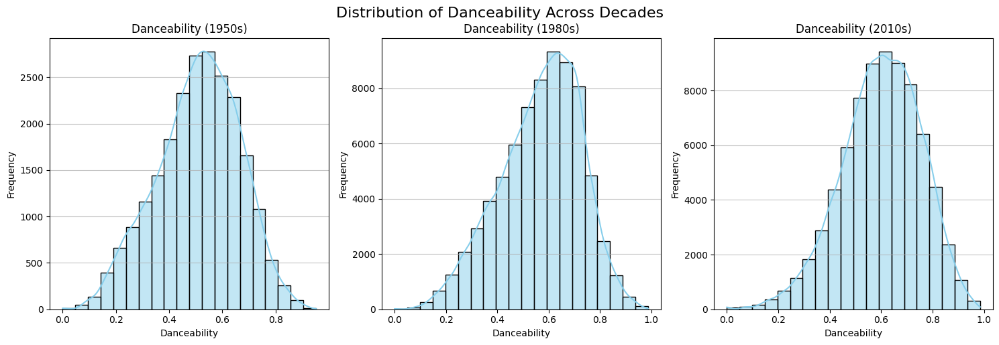

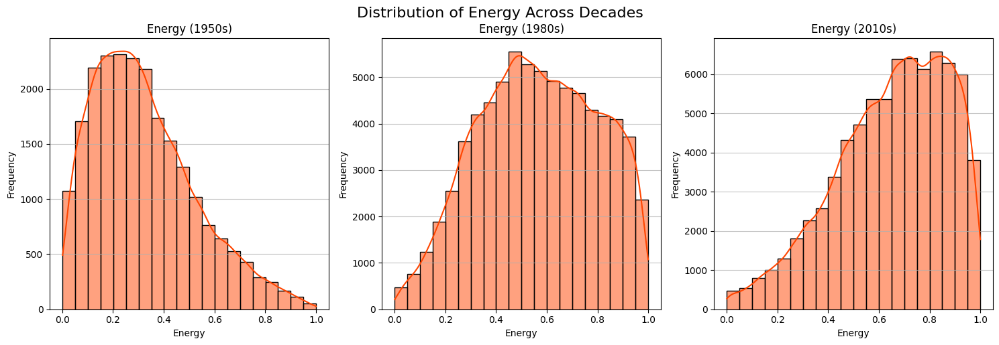

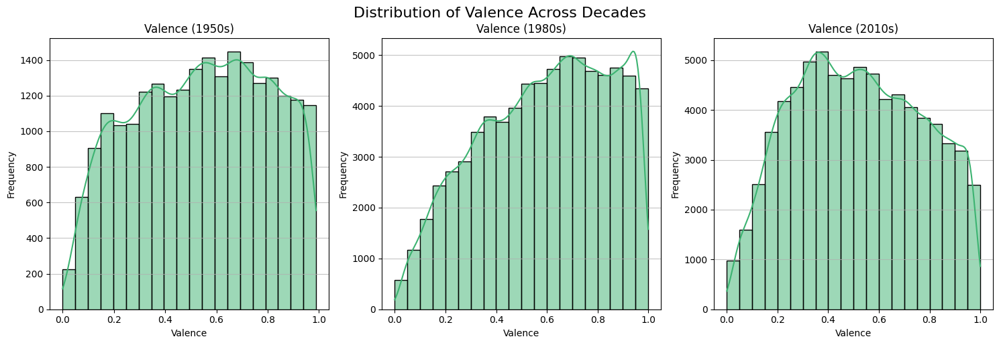

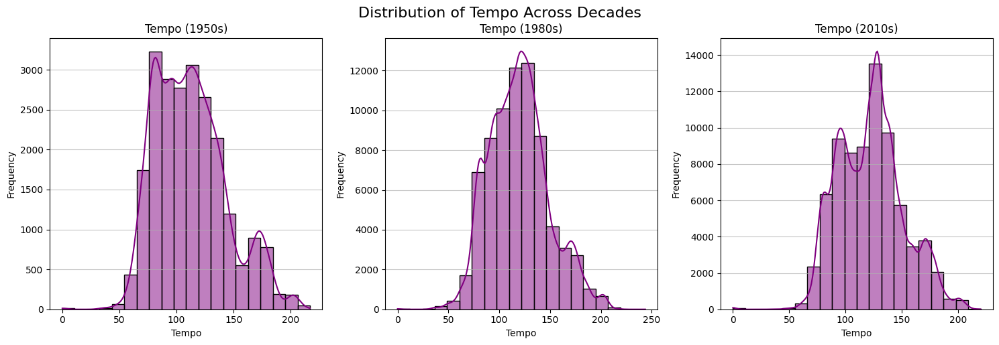

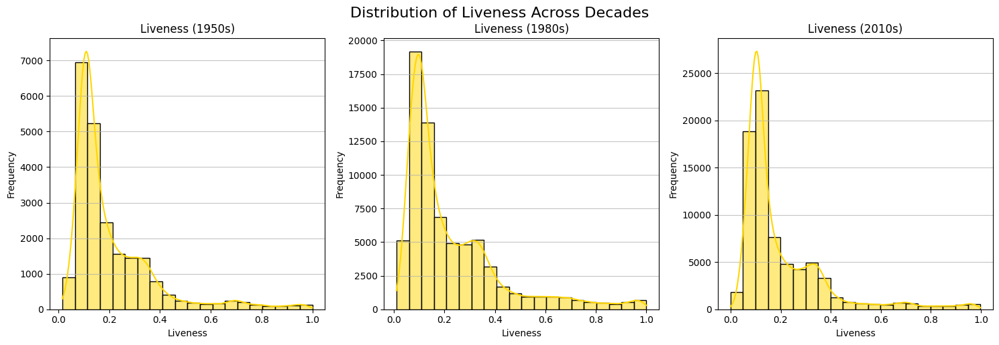

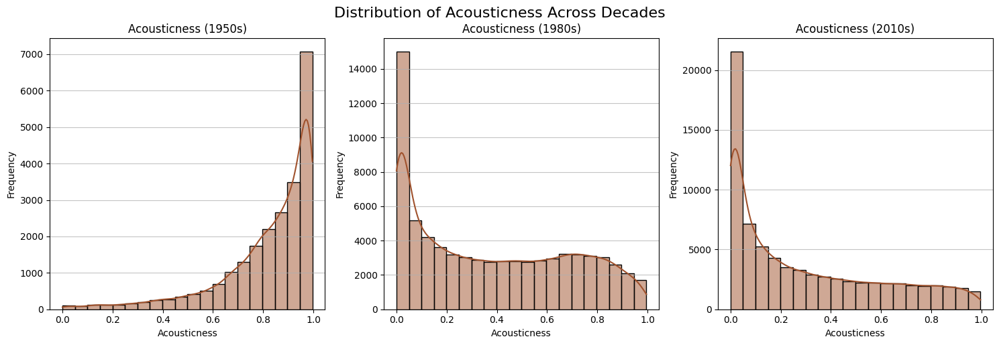

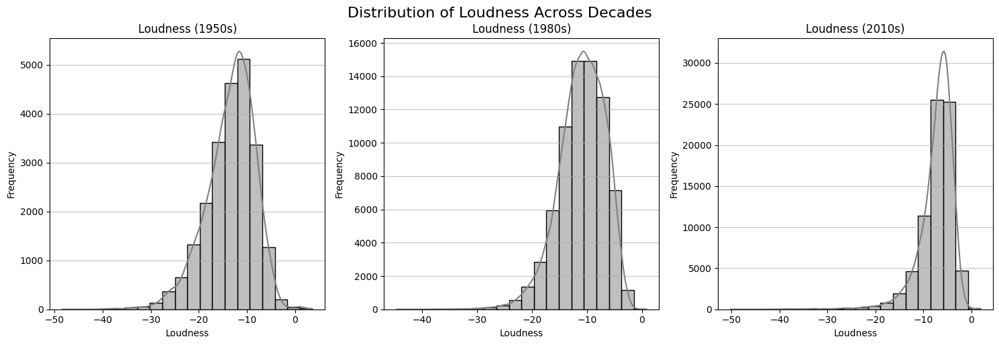

In [ ]:
# @title
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_merged is your DataFrame with the 'year' and song characteristic columns

# Ensure 'year' column is integer type
df_merged['year'] = df_merged['year'].astype(int)

# Define the decades you want to compare
decades_to_compare = [1950, 1980, 2010]

# Define all the characteristics you want to plot
all_characteristics = [
    'danceability',
    'energy',
    'valence',
    'tempo',
    'liveness',
    'acousticness',
    'loudness'
]

# Define a list of distinct colors, one for each characteristic
# You can choose any valid Matplotlib color names or hex codes
characteristic_colors = [
    'skyblue',    # danceability
    'orangered',  # energy
    'mediumseagreen', # valence
    'purple',     # tempo
    'gold',       # lighness
    'sienna',     # acousticness
    'gray'        # loudness
]

# --- Create Separate Figures for Each Characteristic ---

for i, characteristic in enumerate(all_characteristics):
    plt.figure(figsize=(15, 5)) # Adjust figure size as needed for a 1x3 layout

    # Get the color for the current characteristic
    current_color = characteristic_colors[i]

    for j, decade in enumerate(decades_to_compare):
        # Create a subplot for each decade's histogram
        plt.subplot(1, len(decades_to_compare), j + 1) # 1 row, num_decades columns, current plot index
        # Note: Corrected subplot index to 'j + 1' as we are plotting decades in a single row for each characteristic

        # Filter data for the specific decade
        start_year = decade
        end_year = decade + 9
        df_decade = df_merged[(df_merged['year'] >= start_year) & (df_merged['year'] <= end_year)].copy()

        # Create the histogram with the assigned color
        sns.histplot(data=df_decade, x=characteristic, kde=True, bins=20, color=current_color) # Adjust number of bins as needed

        plt.title(f'{characteristic.capitalize()} ({decade}s)')
        plt.xlabel(characteristic.capitalize())
        plt.ylabel('Frequency')
        plt.grid(axis='y', alpha=0.75)

    plt.tight_layout() # Adjust layout to prevent overlap
    plt.suptitle(f'Distribution of {characteristic.capitalize()} Across Decades', y=1.02, fontsize=16) # Add a main title for the figure
    plt.show()

<div style="text-align: justify">

## **Data Visualisation and Analysis 4: Violin Plot**

### The Visualisation Shows the Violin Plot that Compares the Distriubtion of Popularity Scores Between Two Categories of Songs: Explicit and Non-Explicit:
* **Chart Structure**: This visualisation is a violin plot that compares the distribution of popularity scores between two categories of songs: explicit and non-explicit. The plot is oriented vertically, with the two distinct categories (Explicit and Non-Explicit) positioned along the horizontal axis (the x-axis). The vertical axis (the y-axis) represents the 'Popularity' score, showing the range of popularity values observed for songs within each category. The width of the "violin" shape at any given popularity score on the y-axis corresponds to the density of songs with that popularity in that category.
* **Song Representation**: The visualisation groups songs into two distinct categories: those marked as 'Explicit' and those marked as 'Non-Explicit'. Each "violin" shape visually represents the entire distribution of popularity scores for all songs belonging to that category, formed by estimating the probability density of the popularity scores.
* **Popularity Distribution Display**: The popularity of songs within each category is shown as a distribution represented by the shape of the violin. The widest part shows where most songs are clustered by popularity, while narrower parts indicate fewer songs at those levels. Inside each violin, a white dot marks the median popularity, a thick bar shows the interquartile range, and a thin line indicates the general range of the data (whiskers).
* **The Colour Mapping**: The two violin shapes are visually distinguished using a 'muted' colour palette. The distinct colours applied to each violin clearly differentiate the distribution of explicit songs from that of non-explicit songs, helping in their side-by-side comparison.
* **Labelling**: The chart has a clear title: "Popularity Distribution for Explicit vs. Non-Explicit Songs." The x-axis is labelled "Explicit Song," with "Non-Explicit" and "Explicit" replacing the numerical categories, and the y-axis is labelled "Popularity."
* **Labelling**:
  * The entire figure has a main title: "Key Spotify Song Characteristics Trends (1920 onwards) with 99% Confidence Intervals".
  * The first subplot is titled "Combined Audio Characteristics Over Time". Its x-axis is labeled "Year", and its y-axis is labeled "Characteristic Value".
  * The second subplot is titled "Loudness (dB) Over Time". Its x-axis is labeled "Year", and its y-axis is labeled "Loudness (dB)".
  * The third subplot is titled "Tempo (Rhythm) Over Time". Its x-axis is labeled "Year", and its y-axis is labeled "Tempo (BPM)".
  * Legends are present in the first subplot to identify the different lines.
* **Layout Adjustment**: Additionally, plt.tight_layout() is used to automatically adjust the spacing between the subplots and their elements to prevent overlap, and the rect argument is used to make space for the main title at the top. Grid lines are added to each subplot to aid in reading the values along the axes.

#### **Summary of Analysis**
Visual clarity side, the 'Popularity Distribution for Explicit vs. Non-Explicit Songs' violin plot provides valuable insights into the popularity trends of Spotify tracks based on content. Both categories exhibit a broad popularity range, from near zero to over 100, indicating that explicit content alone doesn't dictate a song's overall reach. While the median popularity for both explicit and non-explicit songs appears to be quite similar, hovering roughly between 40 and 50, the shape of the distributions reveals more nuanced differences.

Specifically, the non-explicit songs (blue violin) show a higher concentration within the lower-middle popularity scores (approximately 20-40) and a noticeable density near the very bottom of the scale. In contrast, explicit songs (orange violin) demonstrate a broader spread across the middle to higher popularity ranges, with a particularly significant density at the very top of the popularity scale (80-100). This suggests that although both types of songs can be highly popular or unpopular, a greater proportion of explicit songs tend to achieve peak popularity, while non-explicit songs are more frequently clustered around moderate to lower popularity levels.

</div>


<ipython-input-11-172e35238743>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




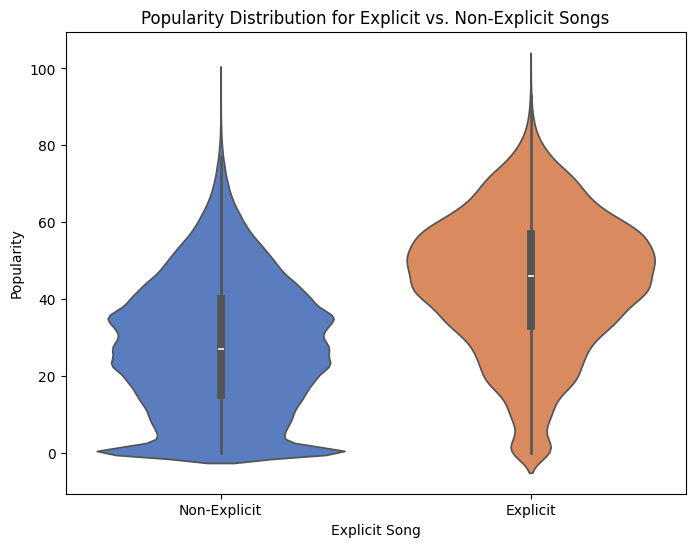

In [ ]:
# @title
plt.figure(figsize=(8, 6))
sns.violinplot(data=df_merged, x='explicit', y='popularity_track', palette='muted')
plt.title('Popularity Distribution for Explicit vs. Non-Explicit Songs')
plt.xlabel('Explicit Song')
plt.ylabel('Popularity')
plt.xticks([0, 1], ['Non-Explicit', 'Explicit'])
plt.show()

<div style="text-align: justify">

## **Data Visualisation and Analysis 5: Line Graph**

### The Visualisation Shows Song Characteristic Changes Over Time
* **Chart Structure**: This visualisation creates a figure containing three separate line plots arranged horizontally within a single row and three columns. The horizontal axis (the x-axis) on all plots represents the 'Year', and the vertical axis (the y-axis) on each plot represents a different song characteristic or a group of characteristics. Each plot displays one or more lines showing the trend of the characteristic(s) over time, along with a 99% confidence interval band around each line.
* **Song Representation**: The data points used in these plots are derived from the df_merged DataFrame, specifically filtered to include songs released from 1920 onwards. The plots aggregate the data by year, showing the average value of each characteristic for each year.
* **Popularity Distribution Display**: This is not a popularity distribution plot. Instead, the plots display the average value of various song characteristics (like 'danceability', 'energy', 'loudness', 'tempo', etc.) calculated for each year in the dataset.
* **The Colour Mapping**: Different song characteristics are represented by different colored lines. While a list of colors (all_colors) is defined, specific colors (audio_colors, loudness_color, tempo_color) are explicitly assigned to the lines in each subplot. A legend is included in the first subplot to identify which color corresponds to which characteristic.

#### **Summary of Analysis**
The combined visualisation offers compelling evidence of how technological advancements and cultural shifts have shaped music over the last century. The steep decline in 'Acousticness' and the corresponding rise in 'Loudness' from the 1940s onwards directly illustrate the impact of improved recording fidelity, amplification technologies, and the "loudness war" in music production. The dramatic increase in 'Energy', 'Danceability', and 'Tempo' from the late 1970s points to the pervasive influence of genres like disco, electronic music, and modern pop, which are inherently designed for high energy and rhythmic drive, catering to a global dance culture.

Conversely, the overall decline in 'Valence' and 'Liveness' over time suggests a cultural shift towards more complex or less overtly 'happy' lyrical and melodic content, and a preference for studio-perfected tracks rather than raw live recordings. The early 20th-century fluctuations across many features, particularly the sharp drops in 'Energy' and 'Tempo' after initial highs, likely reflect the nascent stages of recording technology and the diverse, rapidly changing musical landscape of the 1920s and 1930s before the consolidation of recording practices. Together, these trends paint a vivid picture of music's journey from predominantly acoustic, perhaps more varied, early forms to its increasingly electronic, loud, fast, and highly produced contemporary sound.

</div>


<ipython-input-12-728d634f761e>:29: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.


<ipython-input-12-728d634f761e>:29: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.


<ipython-input-12-728d634f761e>:29: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.


<ipython-input-12-728d634f761e>:29: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.


<ipython-input-12-728d634f761e>:29: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.


<ipython-input-12-728d634f761e>:50: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.


<ipython-input-12-728d634f761e>:61: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 99)` for the same effect.




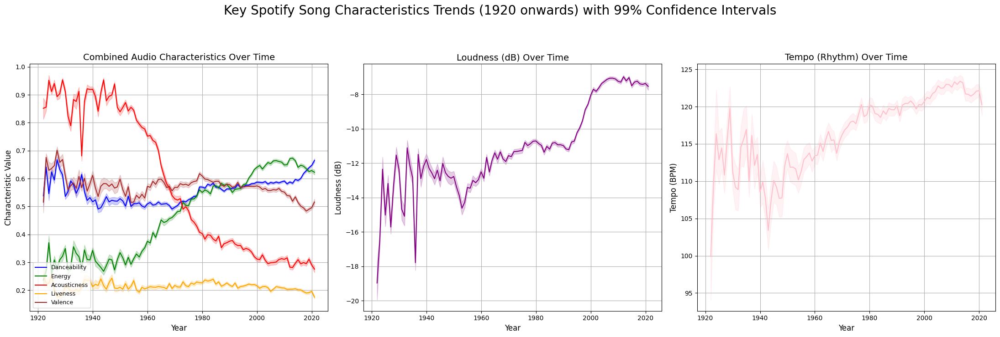

In [ ]:
# @title
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

# Filter the DataFrame to start from 1920
df_filtered = df_merged[df_merged['year'] >= 1920].copy()

# Define a consistent list of colors for all lines across all plots
# Ensure enough distinct colors for all characteristics if plotted individually or on same axis
all_colors = ['blue', 'green', 'red', 'orange', 'brown', 'purple', 'pink', 'gray', 'olive', 'cyan']


# --- Setup the Subplot Grid ---
# We want 3 plots: 1 multi-line, 2 single-line. A 1x3 grid or 3x1 is good.
# Let's go with 1 row and 3 columns for a horizontal arrangement.
fig, axes = plt.subplots(1, 3, figsize=(22, 7)) # Adjust overall figure size for 3 plots horizontally
axes = axes.flatten() # Ensure axes is a 1D array for easy indexing


# --- Plot 1: Audio Characteristic Values (Multiple lines on one subplot) ---
audio_characteristics = ['danceability', 'energy', 'acousticness', 'liveness', 'valence']
audio_colors = ['blue', 'green', 'red', 'orange', 'brown'] # Assign specific colors for clarity

ax1 = axes[0] # First subplot for combined audio characteristics

for i, characteristic in enumerate(audio_characteristics):
    sns.lineplot(
        data=df_filtered,
        x='year',
        y=characteristic,
        ci=99,
        color=audio_colors[i], # Use assigned color
        ax=ax1,
        label=characteristic.capitalize() # Add label for legend
    )

ax1.set_title('Combined Audio Characteristics Over Time', fontsize=14)
ax1.set_xlabel('Year', fontsize=12)
ax1.set_ylabel('Characteristic Value', fontsize=12) # Generic label for 0-1 scale
ax1.grid(True)
ax1.legend(loc='lower left', fontsize=9) # Add legend to differentiate lines


# --- Plot 2: Loudness (dB) ---
ax2 = axes[1] # Second subplot for Loudness
loudness_color = all_colors[5] # Using 'purple' from the original 'colors' list

sns.lineplot(data=df_filtered, x='year', y='loudness', ci=99, color=loudness_color, ax=ax2)
ax2.set_title('Loudness (dB) Over Time', fontsize=14)
ax2.set_xlabel('Year', fontsize=12)
ax2.set_ylabel('Loudness (dB)', fontsize=12)
ax2.grid(True)


# --- Plot 3: Tempo (Rhythm) ---
ax3 = axes[2] # Third subplot for Tempo
tempo_color = all_colors[6] # Using 'pink' from the original 'colors' list

sns.lineplot(data=df_filtered, x='year', y='tempo', ci=99, color=tempo_color, ax=ax3)
ax3.set_title('Tempo (Rhythm) Over Time', fontsize=14)
ax3.set_xlabel('Year', fontsize=12)
ax3.set_ylabel('Tempo (BPM)', fontsize=12)
ax3.grid(True)


# --- Final Figure Adjustments ---
fig.suptitle('Key Spotify Song Characteristics Trends (1920 onwards) with 99% Confidence Intervals', fontsize=20, y=1.05) # Main title for the entire figure
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust layout to make space for the suptitle
plt.show()

## **Data Visualisation and Analysis 6: Ridge Plot (Joyplot)**

### The Visualisation Shows the Distribution of a Selected Song Characteristic Across Different Decades:

* **Chart Structure**: This visualisation creates a figure containing a series of overlapping density plots (the "ridges"), arranged vertically. The vertical axis implicitly represents the different decades (or categories), with each "ridge" corresponding to a specific decade. The horizontal axis represents the value of the selected song characteristic. The height of the density curve at any point on the horizontal axis indicates the relative frequency or density of songs with that characteristic value in that specific decade.
* **Song Representation**: The data points used in this plot are derived from your df_merged DataFrame. The data is grouped by decade (derived from the 'year' column), and the distribution of a single chosen audio characteristic is plotted for each decade. Each "ridge" visually represents the distribution of the selected characteristic for all songs released within that particular decade.
* **Popularity Distribution Display**: This is not a popularity distribution plot, although you could plot the distribution of popularity itself using this method. Instead, this plot displays the distribution of a single, chosen audio characteristic (like 'danceability', 'energy', 'loudness', etc.) for each decade. The shape of each "ridge" reveals where the characteristic values are clustered within that decade, the range of values, and whether the distribution is skewed or multimodal.
* **The Colour Mapping**: The different "ridges," representing different decades, are colored differently based on a chosen colormap (e.g., 'viridis'). The colormap typically maps a range of values (in this case, implicitly the progression of decades) to a range of colors. This application of color helps visually distinguish the distributions of each decade and can sometimes hint at trends or shifts in the distribution over time as the colors change.
* **Labelling**:
  * The entire figure has a main title that indicates the audio characteristic being visualized and that the distributions are by decade (e.g., "Danceability Distribution by Decade").
  * The horizontal axis is labeled with the name of the selected audio characteristic (e.g., "Danceability").
  * The vertical axis labels indicate the different decades being represented by each ridge.
* **Layout Adjustment**: The joypy library handles much of the layout automatically, including the overlapping arrangement and the implicit vertical spacing for each decade.

#### **Summary of Analysis**
This "Energy Distribution by Decade" graph clearly illustrates a profound and consistent shift in the "energy" of music from the early 20th century to the present day. The overall trend shows a remarkable transition from music predominantly characterised by lower energy levels in earlier decades to a much higher energy profile in more recent times. The shape of the distribution for each decade, shown as a density plot, visibly shifts to the right along the x-axis, which represents increasing energy values. This broad movement indicates that, generally, songs released in later decades are perceived as having more drive, intensity, and overall activity.

Looking at the yearly trends and over time changes, the transformation is quite striking. In the 1900s, 1920s, and even into the 1930s, the energy distribution is concentrated heavily on the left side of the graph, with peaks around 0.1 to 0.3 on the energy scale, indicating a prevalence of low-energy music. As we move through the mid-century, from the 1940s to the 1960s, the distribution begins to flatten out and spread more towards the middle, showing a wider range of energy levels becoming more common. However, it's from the 1970s onwards that the most significant shift occurs; the peak of the distribution consistently moves further to the right, signifying that higher energy levels became increasingly dominant. By the 2000s and 2010s, the majority of songs are firmly in the higher energy spectrum, with distributions heavily weighted towards the right, suggesting a strong preference for and production of highly energetic tracks.

The key point of information provided by this visualization is the unmistakable and continuous increase in the average and typical "energy" of popular music over time. It visually confirms that music has become more dynamic, intense, and active across the decades. This isn't just about a few high-energy outliers, but rather a fundamental shift in the distribution of energy across entire decades, highlighting a long-term evolution in musical aesthetics and production, likely influenced by technological advancements, changing genres, and evolving listener preferences for more impactful and engaging sounds.

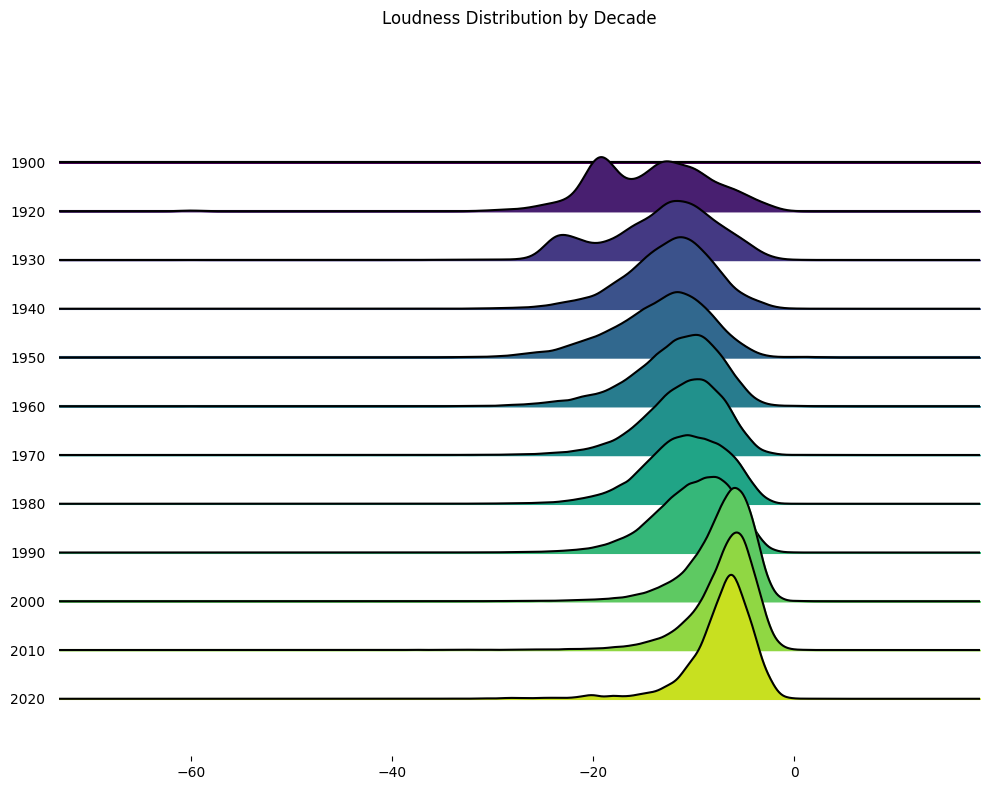

In [ ]:
# @title **Choose a Song Characteristic**
characteristic = "loudness" # @param ["danceability","loudness","energy","acousticness","tempo","valence","liveness"]

import pandas as pd
import matplotlib.pyplot as plt
import joypy
import matplotlib.cm as cm # Import the colormap module

# Assuming df_merged is your DataFrame with the 'year' column

# Create a 'decade' column (if you haven't already)
df_merged['decade'] = (df_merged['year'] // 10) * 10

# Ensure the decades are sorted for proper plotting order
df_merged['decade'] = df_merged['decade'].astype(str) # Convert to string for categorical plotting
df_merged = df_merged.sort_values('decade')

# Choose the audio characteristic you want to visualize
audio_characteristic = characteristic # You can change this

# Create the ridge plot
fig, axes = joypy.joyplot(
    df_merged,
    column=audio_characteristic,
    by='decade',
    figsize=(10, 8), # Adjust figure size as needed
    title=f'{audio_characteristic.capitalize()} Distribution by Decade',
    kind="kde", # Use Kernel Density Estimate
    overlap=2, # Adjust overlap to your preference
    xlabelsize=10,
    ylabelsize=10,
    colormap=cm.viridis # Use a colormap (you can choose others like 'plasma', 'inferno', 'cividis', 'coolwarm', etc.)
)

plt.show()

Top 10 Artists based on Maximum Track Popularity:


,name_artist,popularity_track
35289,Olivia Rodrigo,99
30801,Masked Wolf,98
47920,The Weeknd,97
23897,Kali Uchis,97
48439,Tiësto,95
17215,Giveon,94
12012,Doja Cat,94
46994,The Kid LAROI,94
40966,SZA,93
18747,Harry Styles,92


<ipython-input-14-38fd2081e879>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




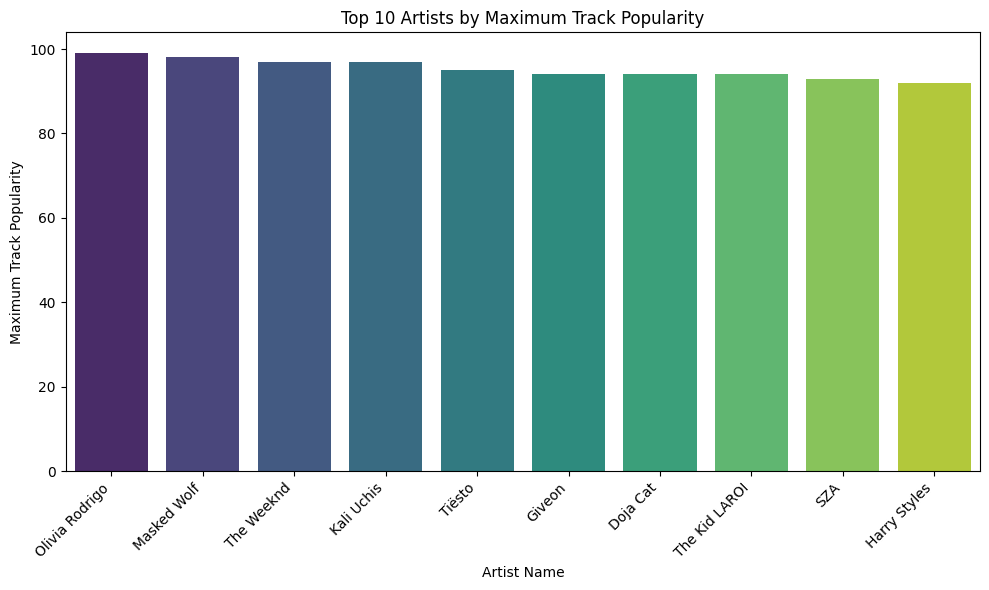

In [ ]:
# prompt: Code me for top 10 artists based on max popularity_track, histogram

import matplotlib.pyplot as plt
# Group by artist name and find the maximum popularity_track for each artist
top_artists = df_merged.groupby('name_artist')['popularity_track'].max().reset_index()

# Sort in descending order and get the top 10
top_10_artists = top_artists.sort_values(by='popularity_track', ascending=False).head(10)

print("Top 10 Artists based on Maximum Track Popularity:")
display(top_10_artists)

# Create a histogram of the max popularity_track for the top 10 artists
plt.figure(figsize=(10, 6))
sns.barplot(x='name_artist', y='popularity_track', data=top_10_artists, palette='viridis')
plt.title('Top 10 Artists by Maximum Track Popularity')
plt.xlabel('Artist Name')
plt.ylabel('Maximum Track Popularity')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.tight_layout() # Adjust layout
plt.show()

In [ ]:
# Save the merged DataFrame to a CSV file
df_merged.to_csv('merged_data.csv', index=False)